In [1]:
import warnings
warnings.filterwarnings('ignore')
import os
import sys
import caiman as cm
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(font_scale=1.5)
sns.set_style("white")
%load_ext autoreload
%autoreload 2
%matplotlib inline
fish_path = os.path.abspath(os.path.join('..'))
if fish_path not in sys.path:
    sys.path.append(fish_path)
from utils.video import videoWrite
import moviepy.editor as mpy
from scipy import io as sio

## 1. Load data

In [3]:
imgStack = np.load('Data/3D_CW_data/17-08-24-L2-CL-VNC-Raw.npy')
Y = imgStack.copy()
Y = Y.transpose([2, 3, 1, 0]) # x, y, z, T
dx, dy, dz, dt = Y.shape

## 2. Detrend raw signal on pixels

In [4]:
Ysg = np.load('tmpData/Y_sg_CW_VNC.npy')
Y_detr = Y - Ysg

# # compare raw pixel and trend
# plt.plot(Y[0, 0, 0, :])
# plt.plot(Ysg[0, 0, 0, :], linewidth=3)
# plt.show()

## 3.Spatial denoising using patched SVD (Greedy algorithm)

### 3.1 Denoising for independent images per stack along z

In [4]:
Y_svd = np.load('tmpData/Y_svd_CW_VNC.npy')
Y_svd_sg = Y_svd + Ysg

### 3.2 Denoising for consecutive stacks

In [5]:
Y_cubic_svd = np.load('tmpData/Y_csvd_CW_VNC.npy')
Y_cubic_svd_sg = Y_cubic_svd + Ysg

In [7]:
sio.savemat('tmpData/Y_CW_VNC.mat', {'Y': Y, 'Y_cubic_svd': Y_cubic_svd, 'Ysg': Ysg})

In [6]:
from ipywidgets import interact, interactive, fixed, interact_manual, IntSlider, Play, HBox
import ipywidgets as widgets
from IPython.display import display
import matplotlib.animation as animation

In [7]:
sliderZ = IntSlider(value=1, min=1, max=Y.shape[2])
sliderT = Play(value=1, min=1, max=Y.shape[3], step=1)

In [8]:
def plot_movie(z=0, t=0):
    fig, ax = plt.subplots(1, 4, figsize=(20, 5))
    ax[0].imshow(Y[:, :, z-1, t-1])
    ax[0].set_axis_off()
    ax[0].set_title('Raw')
    ax[1].imshow(Ysg[:, :,z-1, t-1])
    ax[1].set_axis_off()
    ax[1].set_title('Trend')
    ax[2].imshow(Y_svd_sg[:, :, z-1, t-1])
    ax[2].set_axis_off()
    ax[2].set_title('SVD')
    ax[3].imshow(Y_cubic_svd_sg[:, :, z-1, t-1])
    ax[3].set_axis_off()
    ax[3].set_title('C-SVD')
    plt.show()

In [9]:
interact(plot_movie, z=sliderZ, t = sliderT)

interactive(children=(IntSlider(value=1, description='z', max=22, min=1), Play(value=1, description='t', max=3198, min=1), Output()), _dom_classes=('widget-interact',))

<function __main__.plot_movie>

In [10]:
sliderZ_ = IntSlider(value=1, min=1, max=Y.shape[2])
sliderT_ = Play(value=1, min=1, max=Y.shape[3], step=1)

In [11]:
def plot_movie_detrend(z=0, t=0):
    max_ = max([Y_svd[:, :, z-1, :].max(), Y_cubic_svd[:, :, z-1, :].max()])#, Y_detr[:, :, z-1, :].max()
    min_ = min([Y_svd[:, :, z-1, :].min(), Y_cubic_svd[:, :, z-1, :].min()])#, Y_detr[:, :, z-1, :].min()
    fig, ax = plt.subplots(1, 4, figsize=(20, 5))
    ax[0].imshow(Y_detr[:, :, z-1, t-1], vmin=min_, vmax=max_)
    ax[0].set_axis_off()
    ax[0].set_title('Detrend')
    ax[1].imshow(Y_svd[:, :, z-1, t-1], vmin=min_, vmax=max_)
    ax[1].set_axis_off()
    ax[1].set_title('SVD')
    ax[2].imshow(Y_detr[:, :, z-1, t-1] - Y_cubic_svd[:, :, z-1, t-1], vmin=min_, vmax=max_)
    ax[2].set_axis_off()
    ax[2].set_title('CSVD-Residual')
    ax[3].imshow(Y_cubic_svd[:, :, z-1, t-1], vmin=min_, vmax=max_)
    ax[3].set_axis_off()
    ax[3].set_title('C-SVD')
    plt.show()

In [12]:
interact(plot_movie_detrend, z=sliderZ_, t = sliderT_)

interactive(children=(IntSlider(value=1, description='z', max=22, min=1), Play(value=1, description='t', max=3198, min=1), Output()), _dom_classes=('widget-interact',))

<function __main__.plot_movie_detrend>

In [13]:
def std_projection(z=0):
    max_ = max([Y_svd[:, :, z-1, :].std(-1).max(), Y_cubic_svd[:, :, z-1, :].std(-1).max()])#, Y_detr[:, :, z-1, :].max()
    min_ = min([Y_svd[:, :, z-1, :].std(-1).min(), Y_cubic_svd[:, :, z-1, :].std(-1).min()])#, Y_detr[:, :, z-1, :].min()
    print([max_, min_])
    fig, ax = plt.subplots(1, 4, figsize=(20, 5))
    ax[0].imshow(Y_detr[:, :, z-1, :].std(-1), vmin=min_, vmax=max_)
    ax[0].set_axis_off()
    ax[0].set_title('Detrend')
    ax[1].imshow(Y_svd[:, :, z-1, :].std(-1), vmin=min_, vmax=max_)
    ax[1].set_axis_off()
    ax[1].set_title('SVD')
    ax[2].imshow((Y_detr[:, :, z-1, :] - Y_cubic_svd[:, :, z-1, :]).std(-1), vmin=min_, vmax=max_)
    ax[2].set_axis_off()
    ax[2].set_title('CSVD-Residual')
    ax[3].imshow(Y_cubic_svd[:, :, z-1, :].std(-1), vmin=min_, vmax=max_)
    ax[3].set_axis_off()
    ax[3].set_title('C-SVD')
    plt.show()

interact(std_projection, z=sliderZ_)

interactive(children=(IntSlider(value=1, description='z', max=22, min=1), Output()), _dom_classes=('widget-interact',))

<function __main__.std_projection>

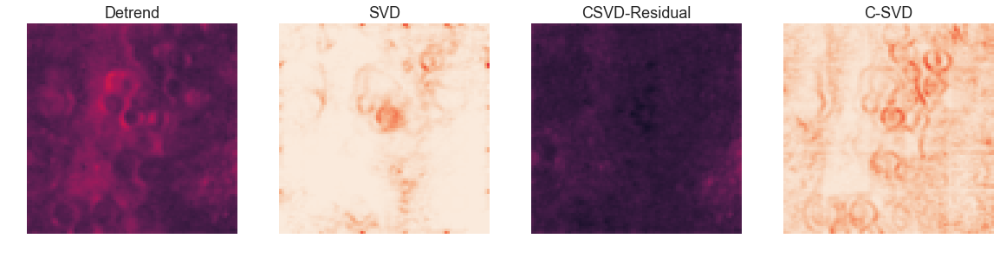

In [14]:
z = 22
fig, ax = plt.subplots(1, 4, figsize=(20, 5))
ax[0].imshow(cm.local_correlations(Y_detr[:, :, z-1, :]), vmin=0, vmax=1)
ax[0].set_axis_off()
ax[0].set_title('Detrend')
ax[1].imshow(cm.local_correlations(Y_svd[:, :, z-1, :]), vmin=0, vmax=1)
ax[1].set_axis_off()
ax[1].set_title('SVD')
ax[2].imshow(cm.local_correlations(Y_detr[:, :, z-1, :] - Y_cubic_svd[:, :, z-1, :]), vmin=0, vmax=1)
ax[2].set_axis_off()
ax[2].set_title('CSVD-Residual')
ax[3].imshow(cm.local_correlations(Y_cubic_svd[:, :, z-1, :]), vmin=0, vmax=1)
ax[3].set_axis_off()
ax[3].set_title('C-SVD')
plt.show()

## 4. Demix

### 4.1 Caiman CNMF 3D

In [15]:
import psutil
from caiman.source_extraction import cnmf as cnmf
from caiman.components_evaluation import evaluate_components, estimate_components_quality_auto
from caiman.cluster import setup_cluster

#### 4.1.1 Setup server

In [16]:
%%capture
n_processes = psutil.cpu_count()
print('using ' + str(n_processes) + ' processes')
print("Stopping  cluster to avoid unnencessary use of memory....")
sys.stdout.flush()  
cm.stop_server()
# START CLUSTER
c, dview, n_processes = setup_cluster(backend='local', n_processes=n_processes, single_thread=False)

#### 4.1.2 Check local correlation matrix (max projections)

#### 4.1.3 Run CNMF for patches

In [17]:
images = np.array(Y_cubic_svd.transpose((3, 2, 0, 1)), order='F') # Y_svd -- x, y, z, t
from skimage.external.tifffile import imsave
imsave('tmpData/demoMovie3D.tif', images)
fname_new = cm.save_memmap(['tmpData/demoMovie3D.tif'], base_name='Yr', is_3D=True)
print(fname_new)
Yr, dims, T = cm.load_memmap(fname_new)
images = np.reshape(Yr.T, [T] + list(dims), order='F') 

tmpData/demoMovie3D.tif
tmpData/Yr_d1_22_d2_80_d3_80_order_F_frames_3198_.mmap


In [ ]:
rf = (2, 10, 10)  # half-size of the patches in pixels. rf=25, patches are 50x50
stride = (1, 5, 5)  # amounpl.it of overlap between the patches in pixels
K = 12  # number of neurons expected per patch
gSig = [0, 5, 5]  # expected half size of neurons
merge_thresh = 0.8  # merging threshold, max correlation allowed
p = 2  # order of the autoregressive system
save_results = False

# RUN ALGORITHM ON PATCHES
init_method = 'greedy_roi'
alpha_snmf = None  # 10e2  # this controls sparsity

cnm = cnmf.CNMF(n_processes, k=K, merge_thresh=0.8, gSig=gSig, p=p, dview=dview, Ain=None, rf=rf, stride=stride, 
                memory_fact=1, method_init=init_method, alpha_snmf=alpha_snmf, only_init_patch=True, gnb=1, 
                method_deconvolution='oasis', ssub=1, tsub=1)

In [21]:
cnm = cnm.fit(images)

(3198, 22, 80, 80)
using 32 processes
[4, 20, 20]
141.30779027938843
Transforming patches into full matrix
Skipped %d Empty Patch 0


ValueError: need at least one array to concatenate

In [ ]:
A_tot = cnm.A
C_tot = cnm.C
YrA_tot = cnm.YrA
b_tot = cnm.b
f_tot = cnm.f
sn_tot = cnm.sn

print(('Number of components:' + str(A_tot.shape[-1])))

### 4.1.4 Refine

In [ ]:
# fit good components again
cnm = cnmf.CNMF(n_processes, k=A_tot.shape, gSig=gSig, merge_thresh=merge_thresh, p=p, dview=dview,
                Ain=A_tot, Cin=C_tot, f_in=f_tot, rf=None, stride=None, method_deconvolution='oasis')
cnm = cnm.fit(images)

In [ ]:
import bokeh.plotting as bpl
bpl.output_notebook()
from caiman.utils.visualization import nb_view_patches3d

In [35]:
# view components per layer
traces_fluo = nb_view_patches3d(cnm.YrA, cnm.A, cnm.C, dims, Yr=Yr, image_type='mean', denoised_color='orange', cmap='gray')

In [ ]:
A = np.array(cnm.A.todense())
A_ = np.reshape(A.T, [A.shape[-1]]+list(dims), order='F')

In [ ]:
def A_matrix(z=0):
    max_ = max([Y_svd[:, :, z-1, :].std(-1).max(), Y_cubic_svd[:, :, z-1, :].std(-1).max()])#, Y_detr[:, :, z-1, :].max()
    min_ = min([Y_svd[:, :, z-1, :].std(-1).min(), Y_cubic_svd[:, :, z-1, :].std(-1).min()])#, Y_detr[:, :, z-1, :].min()
    print([max_, min_])
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(A_[:, z-1, :, :].sum(0))
    ax[0].set_axis_off()
    ax[0].set_title('Weight matrix')
    ax[1].imshow(Y_cubic_svd_sg[:, :, z-1, :].mean(-1))
    ax[1].set_axis_off()
    ax[1].set_title('C-SVD')
    plt.show()

slider_ = IntSlider(value=1, min=1, max=Y.shape[2])
interact(A_matrix, z=slider_)

In [ ]:
dview.terminate()